In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
%ls

drive/  sample_data/


In [ ]:
%cd drive/MyDrive/Bert_Lime

/content/drive/MyDrive/Bert_Lime


In [105]:
!git clone https://github.com/Jeevesh8/arg_mining

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
fatal: destination path 'arg_mining' already exists and is not an empty directory.


In [ ]:
%%capture
#if running on colab, install below 4
!git clone https://github.com/Jeevesh8/arg_mining
!git clone https://github.com/chridey/change-my-view-modes
!pip install transformers
!pip install seqeval datasets allennlp
!pip install flax
!pip install sentencepiece
#if connected to local runtime, run the next command too
# !pip install bs4 tensorflow torch 

In [ ]:
!pip install bertviz

     |████████████████████████████████| 156 kB 5.5 MB/s 


In [1]:
#Run to ignore warnings
import warnings
import numpy as np
warnings.filterwarnings('ignore')
import pickle

### Load Metric

In [2]:
%%capture
from datasets import load_metric
metric = load_metric('seqeval')

2021-11-12 15:21:40.901585: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1


### Define & Load Tokenizer, Model, Dataset

In [3]:
import torch
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

In [4]:
device

device(type='cuda', index=0)

In [5]:
model_version = 'bert-base-cased'

In [6]:
%%capture
from transformers import AutoTokenizer, AutoModel
tokenizer = AutoTokenizer.from_pretrained(model_version,
                                          bos_token = "[CLS]",
                                          eos_token = "[SEP]")
transformer_model = AutoModel.from_pretrained(model_version,output_hidden_states=True, output_attentions = True)

In [7]:
transformer_model = transformer_model.to(device)

In [8]:
import torch.nn as nn

#### To add extra token type embeddings...

In [9]:
def resize_token_type_embeddings(transformer_model, new_size):
    old_embeddings = transformer_model.embeddings.token_type_embeddings.weight
    old_size, hidden_dim = old_embeddings.shape
    transformer_model.embeddings.token_type_embeddings = nn.Embedding(new_size, hidden_dim, device=transformer_model.device)
    with torch.no_grad():
        transformer_model.embeddings.token_type_embeddings.weight[:old_size] = old_embeddings

#resize_token_type_embeddings(transformer_model, 2)
#transformer_model.config.type_vocab_size = 2

In [10]:
%cd Argument\ Mining\ BTP
%ls

/home/anunay18021/Argument Mining BTP
=0.0.7                                 Lime_on_BERT_am.ipynb
arg_mining/                            Lime_on_BERT_am_updated.ipynb
change-my-view-modes/                  linear_layer.pt
crf_layer.pkl                          Mask_Lime_on_BERT_am.ipynb
cross_entropy_layer.pt                 Model/
Data_Extraction_Lime_on_BERT_am.ipynb  temp/
Data_Stats.py                          tokenizer_pre.pkl
Discourse_Markers.txt                  transformer_layer.pt
layer_wise_analysis.pkl


#### Load in discourse markers(Provide ``Discourse_Markers.txt``)

In [11]:
with open('./Discourse_Markers.txt') as f:
    discourse_markers = [dm.strip() for dm in f.readlines()]

* Change the ``batch_size`` in ``arg_mining/datasets/cmv_modes/configs.py`` before running below cell, as needed. [By default: 8]

* Can also change ``max_len`` in the same file to suit the maximum length of your model. All threads will be truncated at ``max_len`` length. 

In [148]:
%%capture
from arg_mining.datasets.DrInventor import load_dataset
from arg_mining.datasets.DrInventor import config as data_config

In [112]:
tokenizer.add_tokens(config["special_tokens"], special_tokens=True)

transformer_model.resize_token_embeddings(len(tokenizer))

Embedding(28997, 768)

In [113]:
batch_size = 2

### Function to get datasets
* Change split sizes, if needed.

In [131]:
def get_datasets(train_sz=100, test_sz=0):
    train_dataset, valid_dataset, test_dataset = load_dataset(tokenizer=tokenizer,
                                                              train_sz=train_sz,
                                                              test_sz=test_sz,
                                                              shuffle=True,
                                                              batch_sz=batch_size,)
    return train_dataset, valid_dataset, test_dataset

### Wrap dataset in ``get_comment_wise_dataset`` if you want to get comment wise dataset

In [115]:
from typing import List, Tuple

In [116]:
def split_encoding(tokenized_thread: List[int], 
                   split_on: List[int], 
                   eos_token_id: int) -> List[List[int]]:
    """Splits tokenized_thread into multiple lists at each occurance of 
    a token_id specified in split_on or the eos_token_id.
    
    1. The eos_token_id is retained in the last splitted component.
    2. Each matched token_id from split_on is retained in the component that 
       follows it.
    """
    splitted = [[]]
    for elem in tokenized_thread:
        if elem in split_on:
            splitted.append([])
        splitted[-1].append(elem)
        if elem == eos_token_id:
            break
    return splitted

def pad_batch(elems: List[List[int]], pad_token_id: int) -> List[List[int]]:
    """Pads all lists in elems to the maximum list length of any list in 
    elems. Pads with pad_token_id.
    """
    max_len = max([len(elem) for elem in elems])
    return [elem+[pad_token_id]*(max_len-len(elem)) for elem in elems]

def get_comment_wise_dataset(dataset,
                             max_len: int=512,
                             batch_size: int=8) -> Tuple[List[List[int]], 
                                                         List[List[int]], 
                                                         List[List[int]]]:
    """
    Args:
        dataset:     A numpy iterator dataset for threads, as returned from 
                     get_datasets() function above.
        max_len:     Maximum length at which to truncate any comment.
        batch_size:  Number of comments in a batch
    
    Returns:
        A tuple having batched & padded(to max. length in batch) tokenized threads, 
        masked threads, and component type labels; where each element corresponds
        to a comment in some thread.
    
    NOTE:
        This function removes the extra num_devices dimension from the elements 
        of dataset provided.
    """
    user_token_indices = tokenizer.encode("[UNU]"+"".join([f"[USER{i}]" for i in range(data_config["max_users"])]))[1:-1]
    comment_wise_tokenized_threads = []
    comment_wise_masked_threads = []
    comment_wise_comp_type_labels = []

    for (tokenized_threads, masked_threads, comp_type_labels, _ ) in dataset:
        tokenized_threads = np.squeeze(tokenized_threads, axis=0).tolist()
        masked_threads = np.squeeze(masked_threads, axis=0).tolist()
        comp_type_labels = np.squeeze(comp_type_labels, axis=0).tolist()

        for tokenized_thread, masked_thread, comp_type_label in zip(tokenized_threads, masked_threads, comp_type_labels):
            splitted_encodings = split_encoding(tokenized_thread, user_token_indices, tokenizer.eos_token_id)
            for elem in splitted_encodings:
                comment_wise_tokenized_threads.append(elem)
                comment_wise_masked_threads.append(masked_thread[:len(elem)])
                comment_wise_comp_type_labels.append(comp_type_label[:len(elem)])
                masked_thread, comp_type_label = masked_thread[len(elem):], comp_type_label[len(elem):]
    i = 0
    cw_tokenized_threads, cw_masked_threads, cw_comp_type_labels = [], [], []
    while i<len(comment_wise_tokenized_threads):
         cw_tokenized_threads.append(comment_wise_tokenized_threads[i][:max_len])
         cw_masked_threads.append(comment_wise_masked_threads[i][:max_len])
         cw_comp_type_labels.append(comment_wise_comp_type_labels[i][:max_len])
         i += 1
         
         if i%batch_size==0:
             yield (pad_batch(cw_tokenized_threads, tokenizer.pad_token_id), 
                    pad_batch(cw_masked_threads, tokenizer.pad_token_id),
                    pad_batch(cw_comp_type_labels, data_config["pad_for"]["comp_type_labels"]))
            
             cw_tokenized_threads, cw_masked_threads, cw_comp_type_labels = [], [], []

In [117]:
from typing import Generator

In [118]:
import random

In [ ]:
l = [1,2,3]
print(random.shuffle(l))
print(l)

None
[3, 1, 2]


In [119]:
def get_masked_data_lists(dataset,
                          left: bool=True) -> Tuple[List[List[int]], List[List[int]]]:
    """
    Args:
        dataset:    A python generator that yields tuples of np.array's
                    consisting of tokenized_threads, masked_threads and component
                    type labels
        left:       If true, left side of components are masked. Otherwise right
                    side is masked.
    Returns:
        A tuple of two lists consisting of samples from entire dataset:
            final_threads:  A list of lists of int. Where each internal list corresponds
                            to a thread masked on one side.
            final_labels:   A list of lists of int. Where each internal list corresponds
                            to a masked component type labels.
    NOTE:
        A left masked sample consists of a tokenized thread whose all tokens before
        the beginning of some argumentative component are [MASK] and the corresponding
        component type labels are "other".
    """
    final_threads, final_labels = [], []
    if not left:
        for (tokenized_threads, _masked_threads, comp_type_labels) in dataset:
            for (tokenized_thread, comp_type_label) in zip(tokenized_threads, comp_type_labels):
                # tokenized_thread = tokenized_thread.tolist()
                # comp_type_label = comp_type_label.tolist()
                left_masked_thread = []
                comp_types_for_left_masked_thread = []
                for i, (_token, label) in enumerate(zip(tokenized_thread, comp_type_label)):
                    if (label == data_config["arg_components"]["B-C"] or 
                        label == data_config["arg_components"]["B-P"]):
                        final_threads.append(left_masked_thread+tokenized_thread[i:])
                        final_labels.append(comp_types_for_left_masked_thread+comp_type_label[i:])
                    left_masked_thread.append(tokenizer.mask_token_id)
                    comp_types_for_left_masked_thread.append(0)
    else:
        for (tokenized_threads, _masked_threads, comp_type_labels) in dataset:
            for (tokenized_thread, comp_type_label) in zip(tokenized_threads, comp_type_labels):
                tokenized_thread = tokenized_thread[::-1]
                comp_type_label = comp_type_label[::-1]
                right_masked_thread = []
                comp_types_for_right_masked_thread = []
                flag = 0
                for i, (_token, label) in enumerate(zip(tokenized_thread, comp_type_label)):
                    if ((label == data_config["arg_components"]["I-C"] or 
                        label == data_config["arg_components"]["I-P"])) and flag:
                        final_threads.append(right_masked_thread+tokenized_thread[i:])
                        final_labels.append(comp_types_for_right_masked_thread+comp_type_label[i:])
                        final_threads[-1] = final_threads[-1][::-1]
                        final_labels[-1] = final_labels[-1][::-1]
                    if(label != data_config["arg_components"]["I-C"] and
                        label != data_config["arg_components"]["I-P"]):
                        flag = 1
                    else:
                        flag = 0
                    right_masked_thread.append(tokenizer.mask_token_id)
                    comp_types_for_right_masked_thread.append(0)
#         print((final_threads, final_labels))
        
    return final_threads, final_labels

def get_masked_dataset(dataset,
                       left:bool = True,
                       shuffle:bool = True,
                       batch_size: int = 10) -> Generator[Tuple[np.ndarray, np.ndarray], None, None]:
    """
    Args:
        dataset:    Same as in get_masked_data_lists()
        left:       Same as in get_masked_data_lists()
        shuffle:    Whether to shuffle around the elements corresponding to masking
                    of various threads. If True, batch will consist of random left/right
                    masked samples from different tokenized_threads, rather than same one.
        batch_size: Number of elements to put in a batch. 
    
    Yields:
        A batch consisting of a tuple of np.array's corresponding to left/right masked
        tokenized_threads, and comp_type_labels.
    """
    masked_threads, labels_for_masked_threads = get_masked_data_lists(dataset, left)
    samples =[(elem1, elem2) for (elem1, elem2) in zip(masked_threads, labels_for_masked_threads)]
    if shuffle:
        random.shuffle(samples)
    
    batch_threads = []
    batch_labels = []
    lengths = []
    for sample in samples:
#         print(sample)
        batch_threads.append(sample[0])
        batch_labels.append(sample[1])
        lengths.append(len(sample[0]))
        if len(batch_threads)==batch_size:
            max_len = max(lengths)
            for thread, label in zip(batch_threads, batch_labels):
                thread += [tokenizer.pad_token_id]*(max_len-len(thread))
                label += [data_config["pad_for"]["comp_type_labels"]]*(max_len-len(thread))
            yield np.array(batch_threads), np.array(batch_labels)
            batch_threads, batch_labels, lengths = [], [], []

### Sample Run for dataset

In [26]:
"""
train_dataset, valid_dataset, test_dataset = get_datasets()
for (tokenized_threads, masked_threads, comp_type_labels) in get_comment_wise_dataset(train_dataset):
    print(len(tokenized_threads[0]))
    print(tokenizer.batch_decode(tokenized_threads))
    print(tokenizer.batch_decode(masked_threads))
    print(comp_type_labels)
    break
"""

'\ntrain_dataset, valid_dataset, test_dataset = get_datasets()\nfor (tokenized_threads, masked_threads, comp_type_labels) in get_comment_wise_dataset(train_dataset):\n    print(len(tokenized_threads[0]))\n    print(tokenizer.batch_decode(tokenized_threads))\n    print(tokenizer.batch_decode(masked_threads))\n    print(comp_type_labels)\n    break\n'

In [ ]:
!pip install --upgrade google-cloud-storage

In [120]:
from allennlp.modules.conditional_random_field import ConditionalRandomField as crf

### Define layers for a Linear-Chain-CRF

In [40]:

from allennlp.modules.conditional_random_field import ConditionalRandomField as crf

ac_dict = data_config["arg_components"]

allowed_transitions =([(ac_dict["B-BC"], ac_dict["I-BC"]), 
                       (ac_dict["B-OC"], ac_dict["I-OC"]),
                       (ac_dict["B-D"], ac_dict["I-D"]),] + 
                      
                      [(ac_dict["I-BC"], ac_dict[ct]) 
                        for ct in ["I-BC", "B-BC", "B-OC","B-D", "O"]] +
                      [(ac_dict["I-OC"], ac_dict[ct]) 
                        for ct in ["I-OC", "B-BC", "B-OC", "B-D", "O"]] +
                      [(ac_dict["I-D"], ac_dict[ct]) 
                        for ct in ["I-D", "B-BC", "B-OC", "B-D", "O"]] +

                      [(ac_dict["O"], ac_dict[ct]) 
                        for ct in ["O", "B-BC", "B-OC", "B-D"]])
                    
def get_crf_head():
    linear_layer = nn.Linear(transformer_model.config.hidden_size,
                             len(ac_dict)).to(device)

    crf_layer = crf(num_tags=len(ac_dict),
                    constraints=allowed_transitions,
                    include_start_end_transitions=False).to(device)

    return linear_layer, crf_layer


linear_layer, crf_layer = get_crf_head()

cross_entropy_layer = nn.CrossEntropyLoss(weight=torch.log(torch.tensor([0.668, 4.531, 2.020, 4.028, 1.388, 4.316, 2.754],
                                                                        device=device)), reduction='none')


In [121]:
linear_path = "Drinventor_linear_layer.pt"
cross_path = "Drinventor_cross_entropy_layer.pt"
crf_path = "Drinventor_crf_layer.pkl"
tokenizer_path = "Drinventor_tokenizer_pre.pkl"
transformer_path = "Drinventor_transformer_layer.pt"

In [122]:
import pickle

### Loss and Prediction Function

In [123]:
def compute(batch: Tuple[torch.Tensor, torch.Tensor],
            preds: bool=False, cross_entropy: bool=True):
    """
    Args:
        batch:  A tuple having tokenized thread of shape [batch_size, seq_len],
                component type labels of shape [batch_size, seq_len], and a global
                attention mask for Longformer, of the same shape.
        
        preds:  If True, returns a List(of batch_size size) of Tuples of form 
                (tag_sequence, viterbi_score) where the tag_sequence is the 
                viterbi-decoded sequence, for the corresponding sample in the batch.
        
        cross_entropy:  This argument will only be used if preds=False, i.e., if 
                        loss is being calculated. If True, then cross entropy loss
                        will also be added to the output loss.
    
    Returns:
        Either the predicted sequences with their scores for each element in the batch
        (if preds is True), or the loss value summed over all elements of the batch
        (if preds is False).
    """
    tokenized_sub_parts, comp_type_labels = batch
    
    pad_mask = torch.where(tokenized_sub_parts!=tokenizer.pad_token_id, 1, 0)

    global_attention_mask = torch.where(torch.logical_or(tokenized_sub_parts==tokenizer.sep_token_id,
                                                         tokenized_sub_parts==tokenizer.bos_token_id), 1, 0)

    logits = linear_layer(transformer_model(input_ids=tokenized_sub_parts,
                                            attention_mask=pad_mask,
                                            global_attention_mask=global_attention_mask).last_hidden_state)
    
    if preds:
        return crf_layer.viterbi_tags(logits, pad_mask)
    
    log_likelihood = crf_layer(logits, comp_type_labels, pad_mask)
    
    if cross_entropy:
        logits = logits.reshape(-1, logits.shape[-1])
        
        pad_mask, comp_type_labels = pad_mask.reshape(-1), comp_type_labels.reshape(-1)
        
        ce_loss = torch.sum(pad_mask*cross_entropy_layer(logits, comp_type_labels))
        
        return ce_loss - log_likelihood

    return -log_likelihood


### Define optimizer

In [134]:
from itertools import chain

import torch.optim as optim

optimizer = optim.Adam(params = chain(transformer_model.parameters(),
                                      linear_layer.parameters(),
                                      crf_layer.parameters()),
                       lr = 2e-5,)

### Training And Evaluation Loops

In [125]:
values_weight = [[] for i in range(5)]
values_bias = [[] for i in range(5)]
def train_left_right(dataset, left: bool=True):
    global values_weight, values_bias;
    accumulate_over = 4
    
    optimizer.zero_grad()
    
    for i, (tokenized_threads, comp_type_labels) in enumerate(get_comment_wise_dataset(dataset)):
        
        #Cast to PyTorch tensor
        tokenized_threads = torch.tensor(tokenized_threads, device=device)
        # masked_threads = torch.tensor(masked_threads, device=device)
        max_size = max([len(i1) for i1 in comp_type_labels])
        # print(max_size)
        new_comp = []
        for l in range(comp_type_labels.shape[0]):
          new_comp.append(list(comp_type_labels[l]) + [0]*(max_size - len(comp_type_labels[l])))
        comp_type_labels = np.array(new_comp)
        # print(type(comp_type_labels))
        comp_type_labels = torch.tensor(comp_type_labels, device=device, dtype=torch.int64)
        
        loss = compute((tokenized_threads,
                        torch.where(tokenized_threads==tokenizer.mask_token_id, 1, 0), 
                        comp_type_labels,))/data_config["batch_size"]
        
        print("Loss: ", loss)

        loss.backward()
        
        if i%accumulate_over==accumulate_over-1:
            optimizer.step()
            optimizer.zero_grad()
    
    optimizer.step()

In [127]:
def evaluate(dataset, metric):
    
    int_to_labels = {v:k for k, v in ac_dict.items()}

    with torch.no_grad():
        for tokenized_sub_parts, comp_type_labels, _ in dataset:
            print("Evaluating") 
           
            #Cast to PyTorch tensor
            tokenized_sub_parts = torch.tensor(tokenized_sub_parts, device=device)
            comp_type_labels = torch.tensor(comp_type_labels, device=device, dtype=torch.long)
            
            preds = compute((tokenized_sub_parts,
                             comp_type_labels,),
                            preds=True)
            
            lengths = torch.sum(torch.where(tokenized_sub_parts!=tokenizer.pad_token_id, 1, 0), 
                                axis=-1)
            
            preds = [ [int_to_labels[pred] for pred in pred[0][:lengths[i]]]
                      for i, pred in enumerate(preds)
                    ]
            
            refs = [ [int_to_labels[ref] for ref in labels[:lengths[i]]]
                     for i, labels in enumerate(comp_type_labels.cpu().tolist())
                   ]
            
            metric.add_batch(predictions=preds, 
                             references=refs,)
                             #tokenized_threads=tokenized_threads.cpu().tolist())
        
    print("\t\t\t\t", metric.compute())


In [138]:
def train(dataset):
    accumulate_over = 4
    
    # optimizer.zero_grad()

    for i, (tokenized_sub_parts, comp_type_labels, _) in enumerate(dataset):
        
        #Cast to PyTorch tensor
        tokenized_sub_parts = torch.tensor(tokenized_sub_parts, device=device)
        comp_type_labels = torch.tensor(comp_type_labels, device=device, dtype=torch.long)
        
        loss = compute((tokenized_sub_parts,
                        comp_type_labels,))/batch_size

        print("Loss:", loss)
        
        loss.backward()
        
        if i%accumulate_over==accumulate_over-1:
            optimizer.step()
            optimizer.zero_grad()
    
    optimizer.step()

### Final Training

In [ ]:

for name, param in transformer_model.named_parameters():
  # if("encoder.layer.11" in name):  
  print(name, param.shape)

In [ ]:
for name, param in linear_layer.named_parameters():
  # if("encoder.layer.11" in name):  
  print(name, param.shape)

weight torch.Size([5, 768])
bias torch.Size([5])


In [ ]:
print(tokenizer.mask_token_id)

103


In [ ]:
tokenized_threads = tokenizer.encode("I point out that many Christians follow the bible which has numerous examples of sexism, but in application, there are numerous branches of Christianity that are no more sexist than secular groups. For example, Congregationalists and Universaliists.", return_tensors='pt')
d_tokenized_threads = tokenized_threads.to(device)
# print(tokenized_threads)3,60,000/yr
pad_mask = torch.where(tokenized_threads!=tokenizer.pad_token_id, 1, 0).to(device)
# print(pad_mask)
output = transformer_model(input_ids=d_tokenized_threads,
                                        attention_mask=pad_mask,)

In [137]:
optimizer.zero_grad()

RuntimeError: ignored

In [149]:
n_epochs = 35
train_dataset, _, test_dataset = get_datasets(50, 50)
train_dataset = [elem for elem in train_dataset]
test_dataset = [elem for elem in test_dataset]
for epoch in range(n_epochs):
    print(f"\t\t\t------------EPOCH {epoch+1}---------------")
    train(train_dataset)
    evaluate(test_dataset, metric)

			------------EPOCH 1---------------


ValueError: ignored

In [ ]:
torch.save(linear_layer.state_dict(), linear_path)
torch.save(cross_entropy_layer.state_dict(), cross_path)
torch.save(transformer_model.state_dict(), transformer_path)
with open(crf_path, "wb") as f:
  pickle.dump(crf_layer, f)
with open(tokenizer_path, "wb") as f:
  pickle.dump(tokenizer, f)

In [ ]:
# linear_path = "Model/linear_layer.pt"
# cross_path = "Model/cross_entropy_layer.pt"
# crf_path = "Model/crf_layer.pkl"
# tokenizer_path = "Model/tokenizer_pre.pkl"
# transformer_path = "Model/transformer_layer.pt"

In [ ]:
linear_path = "Drinventor_linear_layer.pt"
cross_path = "Drinventor_cross_entropy_layer.pt"
crf_path = "Drinventor_crf_layer.pkl"
tokenizer_path = "Drinventor_tokenizer_pre.pkl"
transformer_path = "Drinventor_transformer_layer.pt"

In [ ]:
linear_layer.load_state_dict(torch.load(linear_path, map_location=device))
cross_entropy_layer.load_state_dict(torch.load(cross_path, map_location=device))
transformer_model.load_state_dict(torch.load(transformer_path , map_location=device))
with open(crf_path, "rb") as f:
  crf_layer = pickle.load(f)
with open(tokenizer_path, "rb") as f:
  tokenizer = pickle.load(f)

In [ ]:
from itertools import chain

import torch.optim as optim

optimizer = optim.Adam(params = chain(transformer_model.parameters(),
                                      linear_layer.parameters(),
                                      crf_layer.parameters()),
                       lr = 2e-5,)

In [ ]:
def evaluate_left_right(dataset, metric, left):
    
    int_to_labels = {v:k for k, v in ac_dict.items()}
    print('ENTER')
    
    with torch.no_grad():
        for tokenized_threads, comp_type_labels in get_masked_dataset(get_comment_wise_dataset(dataset),
                                                                      left):
            #Cast to PyTorch tensor
            # print(tokenized_threads)
            tokenized_threads = torch.tensor(tokenized_threads, device=device)
            max_size = max([len(i1) for i1 in comp_type_labels])
            # print(max_size)
            new_comp = []
            for l in range(comp_type_labels.shape[0]):
              new_comp.append(list(comp_type_labels[l]) + [0]*(max_size - len(comp_type_labels[l])))
            comp_type_labels = np.array(new_comp)
            comp_type_labels = torch.tensor(comp_type_labels, device=device)
            
            preds = compute((tokenized_threads,
                            torch.where(tokenized_threads==tokenizer.mask_token_id, 1, 0),
                            comp_type_labels,), preds=True)
            total_pred = []
            total_ref = []
              
            if not left:
              for i in range(tokenized_threads.shape[0]):
                temp = []
                temp_ref = []
                flag = False;
                for j in range(tokenized_threads.shape[1]):
                  if(tokenized_threads[i, j] != tokenizer.pad_token_id and flag):
                    temp.append(preds[i][0][j])
                    temp_ref.append(int(comp_type_labels[i][j].cpu().numpy()))
                  if(tokenized_threads[i, j] != tokenizer.mask_token_id):
                    flag = True
                total_pred.append(temp)
                total_ref.append(temp_ref);
            else:
              for i in range(tokenized_threads.shape[0]):
                temp = []
                temp_ref = []
                flag = False;
                for j in range(tokenized_threads.shape[1] - 1, -1, -1):
                  if(tokenized_threads[i, j] != tokenizer.pad_token_id and flag):
                    temp.append(preds[i][0][j])
                    temp_ref.append(int(comp_type_labels[i][j].cpu().numpy()))
                  if(tokenized_threads[i, j] != tokenizer.mask_token_id):
                    flag = True
                total_pred.append(temp[::-1])
                total_ref.append(temp_ref[::-1]);
            lengths = torch.sum(torch.where(tokenized_threads!=tokenizer.pad_token_id, 1, 0), 
                                  axis=-1)
            preds = [ [int_to_labels[pr] for pr in pred]
                    for i, pred in enumerate(total_pred)
                    ]
            
            refs = [ [int_to_labels[ref] for ref in labels]
                    for i, labels in enumerate(total_ref)
                ]
            metric.add_batch(predictions=preds, 
                            references=refs,)
                            #tokenized_threads=tokenized_threads.cpu().tolist())
        
    print(metric.compute())

In [ ]:
actual_layer = [[] for i in range(13)]
def layer_wise_compute(batch: Tuple[torch.Tensor, torch.Tensor, torch.Tensor],
            preds: bool=False, cross_entropy: bool=True):
    """
    Args:
        batch:  A tuple having tokenized thread of shape [batch_size, seq_len],
                component type labels of shape [batch_size, seq_len], and a global
                attention mask for Longformer, of the same shape.
        
        preds:  If True, returns a List(of batch_size size) of Tuples of form 
                (tag_sequence, viterbi_score) where the tag_sequence is the 
                viterbi-decoded sequence, for the corresponding sample in the batch.
        
        cross_entropy:  This argument will only be used if preds=False, i.e., if 
                        loss is being calculated. If True, then cross entropy loss
                        will also be added to the output loss.
    
    Returns:
        Either the predicted sequences with their scores for each element in the batch
        (if preds is True), or the loss value summed over all elements of the batch
        (if preds is False).
    """
    tokenized_threads, token_type_ids, comp_type_labels = batch
    
    pad_mask = torch.where(tokenized_threads!=tokenizer.pad_token_id, 1, 0)

    logit_all = transformer_model(input_ids=tokenized_threads,
                                                attention_mask=pad_mask,).hidden_states

    for i in tqdm(range(12)):
        
        logits = linear_layer(logit_all[i])
        tags = crf_layer.viterbi_tags(logits, pad_mask)
        for row in range(len(tags)):
          for col in range(len(tags[row][0])):
            if(tokenizer.pad_token_id == tokenized_threads[row][col] or tokenizer.mask_token_id == tokenized_threads[row][col]):
              continue
            actual_layer[i].append((tags[row][0][col], logits[row][col].cpu().numpy(), comp_type_labels[row][col].cpu().numpy()))

def layer_wise_evaluate(dataset, metric):
    
    int_to_labels = {v:k for k, v in ac_dict.items()}
    print('ENTER')
    
    with torch.no_grad():
        for tokenized_threads, masked_threads, comp_type_labels in get_comment_wise_dataset(dataset):
            # print(comp_type_labels)
            #Cast to PyTorch tensor
            tokenized_threads = torch.tensor(tokenized_threads, device=device)
            masked_threads = torch.tensor(masked_threads, device=device)
            comp_type_labels = torch.tensor(comp_type_labels, device=device)
            # print(tokenized_threads)
            # print(comp_type_labels.shape)
            # print(comp_type_labels)
            preds = layer_wise_compute((tokenized_threads,
                            torch.where(masked_threads==tokenizer.mask_token_id, 1, 0), 
                            comp_type_labels,), preds=True)
            
        

In [ ]:
tokenizer.pad_token_id

0

In [ ]:
from tqdm import tqdm

In [ ]:
n_epochs = 1
for epoch in range(n_epochs):
    print(f"------------EPOCH {epoch+1}---------------")
    train_dataset, _, test_dataset = get_datasets()
    # train(train_dataset)
    layer_wise_evaluate(train_dataset, metric)

------------EPOCH 1---------------
ENTER


100%|██████████| 12/12 [00:06<00:00,  1.75it/s]


In [ ]:
layer_wise_analysis_path = "layer_wise_analysis.pkl"
with open(layer_wise_analysis_path, "wb") as f:
  pickle.dump(actual_layer, f)
  

In [ ]:
%cd Argument\ Mining\ BTP
%ls
import pickle

[Errno 2] No such file or directory: 'Argument Mining BTP'
/content/drive/MyDrive/Bert_Lime
arg_mining/             data_runner.pkl          temp/
change-my-view-modes/   Discourse_Markers.txt    tokenizer_pre.pkl
crf_layer.pkl           layer_wise_analysis.pkl  transformer_layer.pt
cross_entropy_layer.pt  linear_layer.pt
data_dict.pkl           Model/


In [ ]:
layer_wise_analysis_path = "layer_wise_analysis.pkl"
with open(layer_wise_analysis_path, "rb") as f:
  actual_layer = pickle.load( f)

In [ ]:
print(len(actual_layer))

13


In [ ]:
print(actual_layer[-1])

[]


In [ ]:
data_layer = []
data_class_wise_layer = {}

class_names = ['O', 'B-C', 'I-C', 'B-P', 'I-P']
for j in class_names:
  data_class_wise_layer[j] = []
for i in range(len(actual_layer)):
  count = 0
  for j in actual_layer[i]:
    count += (j[0] == j[2])
  data_layer.append((count, len(actual_layer[i])))
  for key in range(len(class_names)):
    cnt = 0
    den = 0
    for j in actual_layer[i]:
      cnt += (j[0] == j[2] and j[2] == key)
      den += (j[2] == key)
    print(cnt, den)
    data_class_wise_layer[class_names[key]].append((cnt, den))
  

13117 13431
8 717
154 12610
10 914
39 17940
12242 13431
23 717
548 12610
25 914
322 17940
11171 13431
26 717
871 12610
85 914
650 17940
10076 13431
58 717
1246 12610
132 914
1091 17940
10315 13431
51 717
1231 12610
160 914
1238 17940
9657 13431
39 717
1538 12610
291 914
1812 17940
10292 13431
109 717
2350 12610
331 914
2453 17940
11056 13431
148 717
3795 12610
461 914
4511 17940
11700 13431
239 717
6385 12610
653 914
10701 17940
11106 13431
507 717
11552 12610
760 914
14871 17940
12369 13431
666 717
12552 12610
780 914
16954 17940
12764 13431
689 717
12607 12610
851 914
17237 17940
0 0
0 0
0 0
0 0
0 0


In [ ]:
print(data_layer)
print(data_class_wise_layer)

[(13328, 45612), (13160, 45612), (12803, 45612), (12603, 45612), (12995, 45612), (13337, 45612), (15535, 45612), (19971, 45612), (29678, 45612), (38796, 45612), (43321, 45612), (44148, 45612), (0, 0)]
{'O': [(13117, 13431), (12242, 13431), (11171, 13431), (10076, 13431), (10315, 13431), (9657, 13431), (10292, 13431), (11056, 13431), (11700, 13431), (11106, 13431), (12369, 13431), (12764, 13431), (0, 0)], 'B-C': [(8, 717), (23, 717), (26, 717), (58, 717), (51, 717), (39, 717), (109, 717), (148, 717), (239, 717), (507, 717), (666, 717), (689, 717), (0, 0)], 'I-C': [(154, 12610), (548, 12610), (871, 12610), (1246, 12610), (1231, 12610), (1538, 12610), (2350, 12610), (3795, 12610), (6385, 12610), (11552, 12610), (12552, 12610), (12607, 12610), (0, 0)], 'B-P': [(10, 914), (25, 914), (85, 914), (132, 914), (160, 914), (291, 914), (331, 914), (461, 914), (653, 914), (760, 914), (780, 914), (851, 914), (0, 0)], 'I-P': [(39, 17940), (322, 17940), (650, 17940), (1091, 17940), (1238, 17940), (181

In [ ]:
import matplotlib.pyplot as plt


In [ ]:
def plot2(img1_bar, img2_bar, img3_bar, img4_bar, img5_bar, img6_bar):
  fig, arr = plt.subplots(2, 5)
  fig.set_figheight(15)
  fig.set_figwidth(15)
  img1 = arr[0][0]
  arr[0][1].set_visible(False)
  arr[0][2].set_visible(False)
  arr[0][3].set_visible(False)
  arr[0][4].set_visible(False)
  img2, img3, img4, img5, img6 = arr[1][0], arr[1][1], arr[1][2], arr[1][3], arr[1][4]
  img1.set_title(" Total ")
  img1.set_xlabel("layer number")
  img1.set_ylabel("Correct predictions")
  img2.set_title(" O Class ")
  img2.set_xlabel("layer number")
  img2.set_ylabel("Correct predictions")
  img3.set_title(" B-C class")
  img3.set_xlabel("layer number")
  img3.set_ylabel("Correct predictions")
  img4.set_title(" I-C class")
  img4.set_xlabel("layer number")
  img4.set_ylabel("Correct predictions")
  img5.set_title(" B-P class")
  img5.set_xlabel("layer number")
  img5.set_ylabel("Correct predictions")
  img6.set_title(" I-P class")
  img6.set_xlabel("layer number")
  img6.set_ylabel("Correct predictions")

  img1.bar(list(range(13)),[i[0]/(i[1] + (i[1] == 0)) for i in img1_bar])
  img2.bar(list(range(13)),[i[0]/(i[1] + (i[1] == 0)) for i in img2_bar])
  img3.bar(list(range(13)),[i[0]/(i[1] + (i[1] == 0)) for i in img3_bar])
  img4.bar(list(range(13)),[i[0]/(i[1] + (i[1] == 0)) for i in img4_bar])
  img5.bar(list(range(13)),[i[0]/(i[1] + (i[1] == 0)) for i in img5_bar])
  img6.bar(list(range(13)),[i[0]/(i[1] + (i[1] == 0)) for i in img6_bar])
  plt.show()
  plt.close()

In [ ]:
print(data_layer)

[(13328, 45612), (13160, 45612), (12803, 45612), (12603, 45612), (12995, 45612), (13337, 45612), (15535, 45612), (19971, 45612), (29678, 45612), (38796, 45612), (43321, 45612), (44148, 45612), (0, 0)]


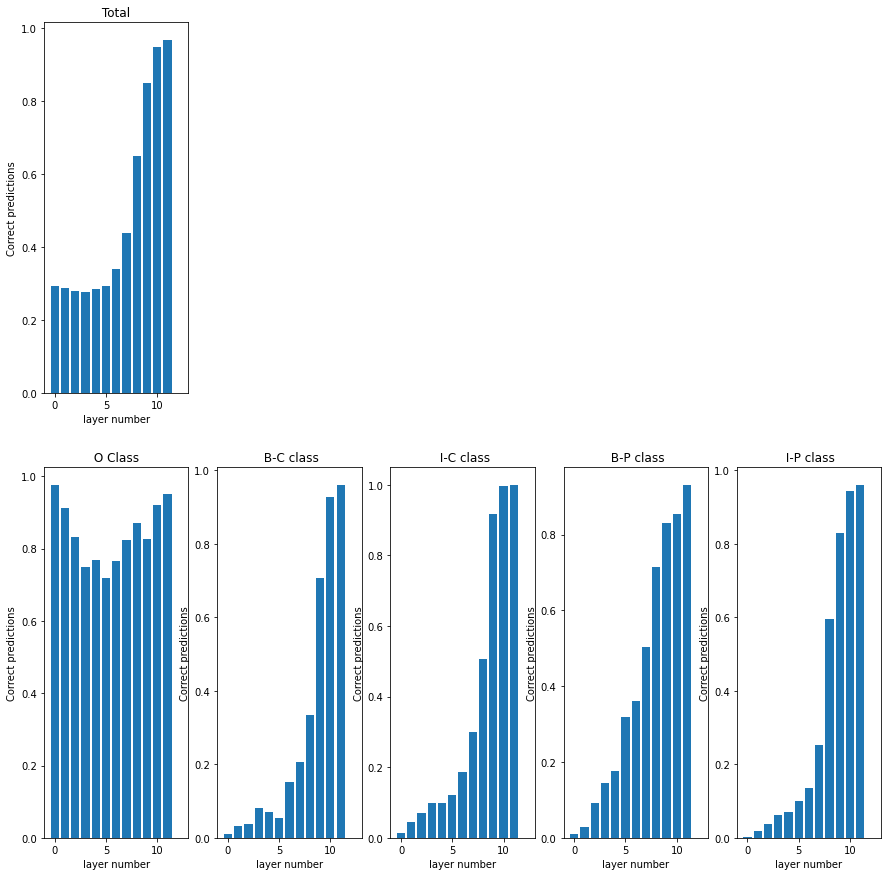

In [ ]:
plot2(data_layer, data_class_wise_layer['O'], data_class_wise_layer['B-C'], data_class_wise_layer['I-C'], data_class_wise_layer['B-P'], data_class_wise_layer['I-P'])

In [ ]:
%cd Model/
%ls

/home/anunay18021/Argument Mining BTP/Model
crf_layer.pkl           Discourse_Markers.txt  transformer_layer.pt
cross_entropy_layer.pt  linear_layer.pt
data_dict.pkl           tokenizer_pre.pkl


In [ ]:
data_path = "data_dict.pkl"
with open(data_path, "rb") as f:
  attention_set = pickle.load(f)

In [ ]:
print(attention_set.keys())
print(attention_set['B-C']['Positive'])

dict_keys(['B-P', 'B-C', 'Net Effect'])
{'PAD': [0.010109590511602503, 0.041469699974625567, 0.011535767376232233, 0.009324534780530719, 0.00909613742497488, 0.018191759480027905, 0.017140766353718404, 0.03748877425220143, 0.008760657188606332, 0.024214055284493996, 0.00834122826017957, 0.052963565467494575, 0.02623748954929887, 0.041182808439285803, 0.04514388780812835, 0.02845772045524071, 0.022750668097559962, 0.03020830151604218, 0.03951129225586368, 0.009920579039710636, 0.01005052886304925, 0.020405735181229658, 0.015495555934784834, 0.022814486860475398, 0.03167084670094355, 0.06360893332480048, 0.024660643057859526, 0.0448873676593669, 0.015963898536569272, 0.015080639129016417, 0.00975671550522142, 0.02501254687424635, 0.019840939718734765, 0.019976507896835985, 0.014188543938304298, 0.029689842986322858, 0.022104550373946645, 0.034140891737510136, 0.01838619355793276, 0.040398309297959054, 0.011062745147184203, 0.07729970021477361, 0.019726497108756867, 0.03537863346413045, 0

In [ ]:
def plot2(img1_bar, img2_bar, img3_bar, img1_bar_neg, img2_bar_neg, img3_bar_neg):
  fig, arr = plt.subplots(2, 3)
  fig.set_figheight(30)
  fig.set_figwidth(30)
  img1, img2, img3 = arr[0][0], arr[0][1], arr[0][2]
  img1_neg, img2_neg, img3_neg = arr[1][0], arr[1][1], arr[1][2]
  img1.set_title("top +ve effect on B-P")
  img1.set_xlabel("token")
  img1.set_ylabel("effect")
  img2.set_title("top +ve effect on B-C")
  img2.set_xlabel("token")
  img2.set_ylabel("effect")
  img3.set_title("top +ve effect")
  img3.set_xlabel("token")
  img3.set_ylabel("effect")
  img1_neg.set_title("top -ve effect on B-P")
  img1_neg.set_xlabel("token")
  img1_neg.set_ylabel("effect")
  img2_neg.set_title("top -ve effect on B-C")
  img2_neg.set_xlabel("token")
  img2_neg.set_ylabel("effect")
  img3_neg.set_title("top -ve effect")
  img3_neg.set_xlabel("token")
  img3_neg.set_ylabel("effect")
  img1.bar([i[0] for i in img1_bar[:10]], [i[1] for i in img1_bar[:10]])
  img2.bar([i[0] for i in img2_bar[:10]], [i[1] for i in img2_bar[:10]])
  img3.bar([i[0] for i in img3_bar[:10]], [i[1] for i in img3_bar[:10]])
  img1_neg.bar([i[0] for i in img1_bar_neg[-10:]], [i[1] for i in img1_bar_neg[-10:]])
  img2_neg.bar([i[0] for i in img2_bar_neg[-10:]], [i[1] for i in img2_bar_neg[-10:]])
  img3_neg.bar([i[0] for i in img3_bar_neg[-10:]], [i[1] for i in img3_bar_neg[-10:]])
  plt.show()
  plt.close()

In [ ]:
from tqdm import tqdm
def convert(tok_dict, flag):
  stats = []
  for i in tqdm(tok_dict):
    if(flag == "MEAN"):
      stats.append((i,sum(tok_dict[i])/len(tok_dict[i])))
    elif (flag == "MEDIAN"):
      stats.append((i,sorted(tok_dict[i])[len(tok_dict[i])//2]))
    elif (flag == "MAX"):
      sign = max(tok_dict[i]) / abs(max(tok_dict[i]))
      stats.append((i,sign*max([sign*j for j in tok_dict[i]])))
    elif (flag == "MIN"):
      sign = min(tok_dict[i]) / abs(min(tok_dict[i]))
      stats.append((i,sign*min([sign*j for j in tok_dict[i]])))
    
  stats.sort(key = lambda x: x[1], reverse=True)
  # print(stats)
  return stats

In [ ]:
l = list(range(10000))
l[-10:]

[9990, 9991, 9992, 9993, 9994, 9995, 9996, 9997, 9998, 9999]

100%|███████████████████████████████████| 1124/1124 [00:00<00:00, 722070.41it/s]


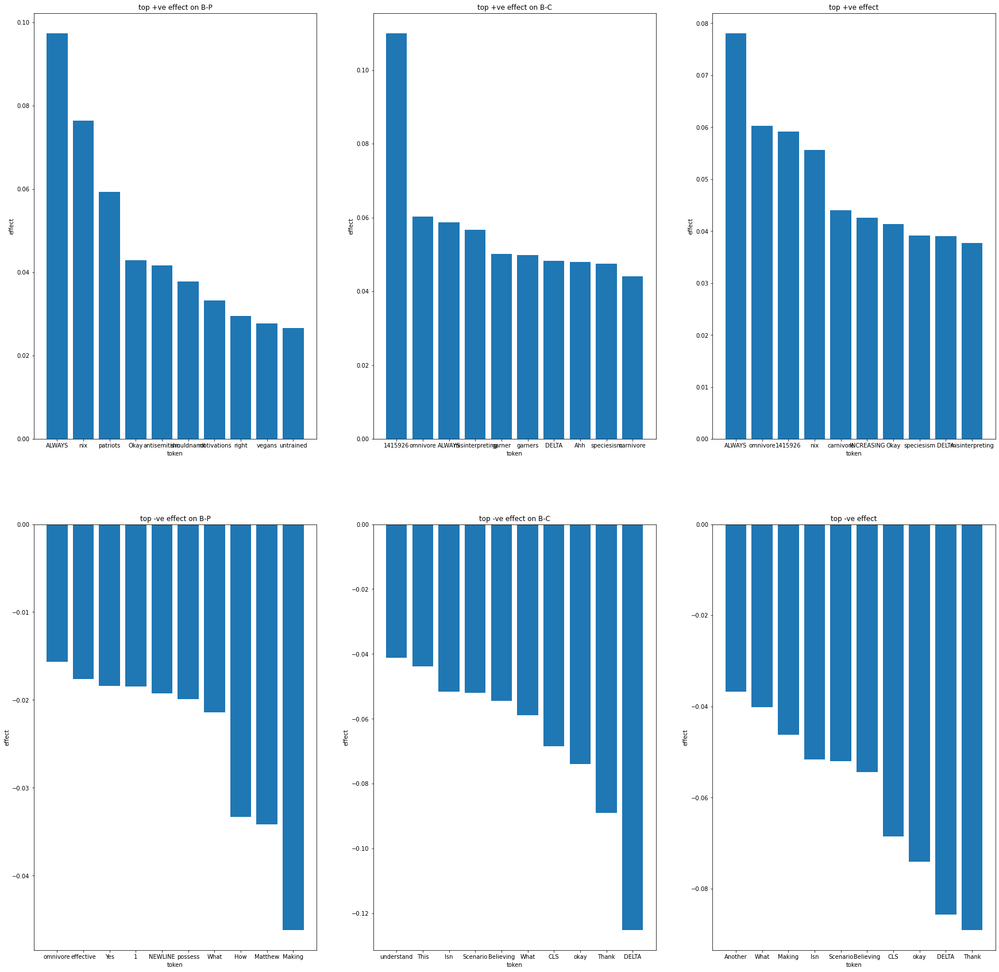

In [ ]:
stat_choice = ["MEAN", "MEDIAN", "MAX", "MIN"]
i = stat_choice[0]
plot2(convert(attention_set['B-P']['Positive'], i), convert(attention_set['B-C']['Positive'], i), convert(attention_set['Net Effect']["Positive"], i), convert(attention_set['B-P']["Negative"], i), convert(attention_set['B-C']["Negative"], i), convert(attention_set['Net Effect']["Negative"], i))

100%|███████████████████████████████████| 1124/1124 [00:00<00:00, 760264.10it/s]


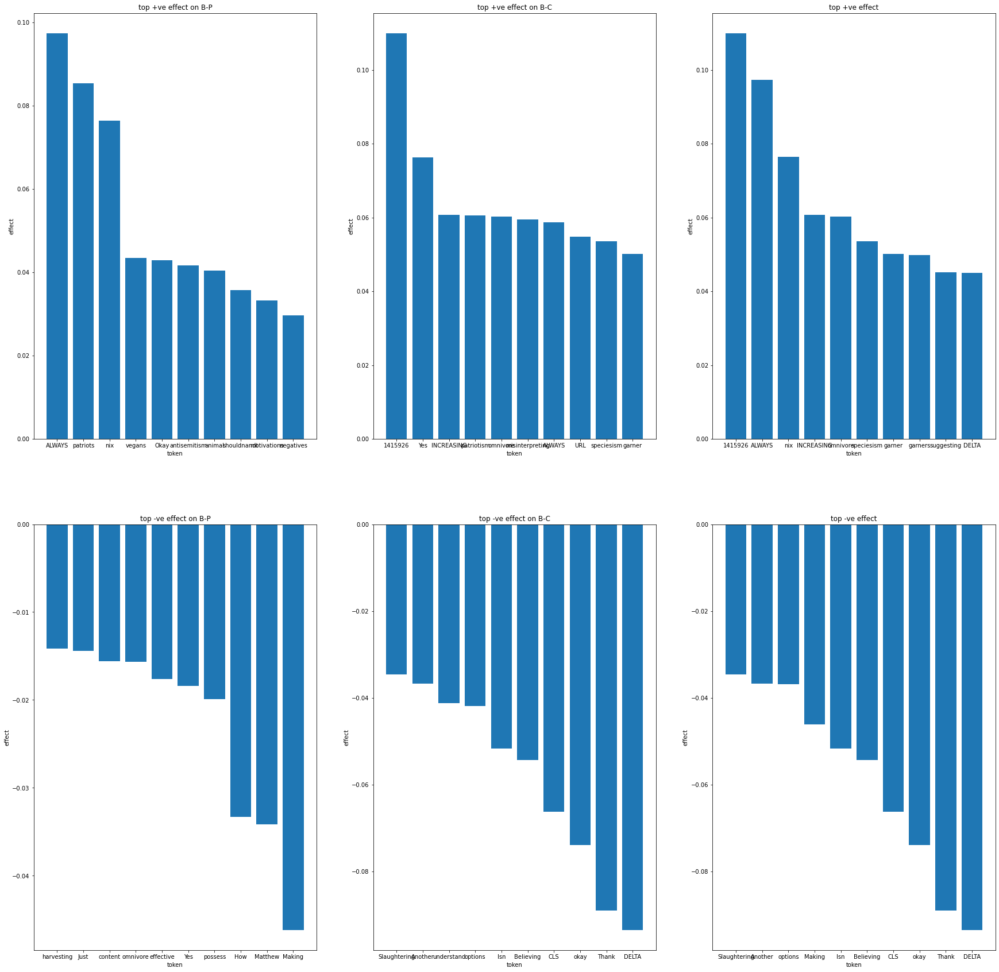

In [ ]:
i = stat_choice[1]
plot2(convert(attention_set['B-P']['Positive'], i), convert(attention_set['B-C']['Positive'], i), convert(attention_set['Net Effect']["Positive"], i), convert(attention_set['B-P']["Negative"], i), convert(attention_set['B-C']["Negative"], i), convert(attention_set['Net Effect']["Negative"], i))

100%|███████████████████████████████████| 1124/1124 [00:00<00:00, 421191.61it/s]


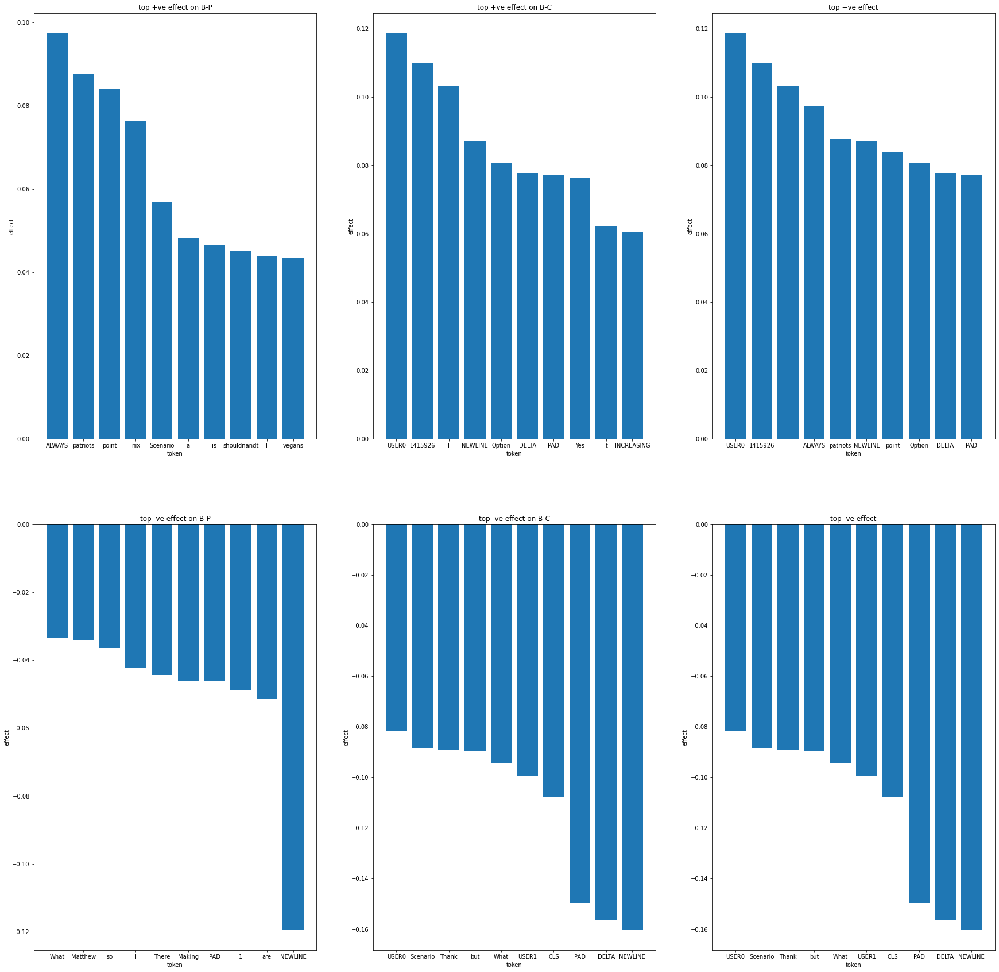

In [ ]:
i = stat_choice[2]
plot2(convert(attention_set['B-P']['Positive'], i), convert(attention_set['B-C']['Positive'], i), convert(attention_set['Net Effect']["Positive"], i), convert(attention_set['B-P']["Negative"], i), convert(attention_set['B-C']["Negative"], i), convert(attention_set['Net Effect']["Negative"], i))

100%|███████████████████████████████████| 1124/1124 [00:00<00:00, 352610.15it/s]


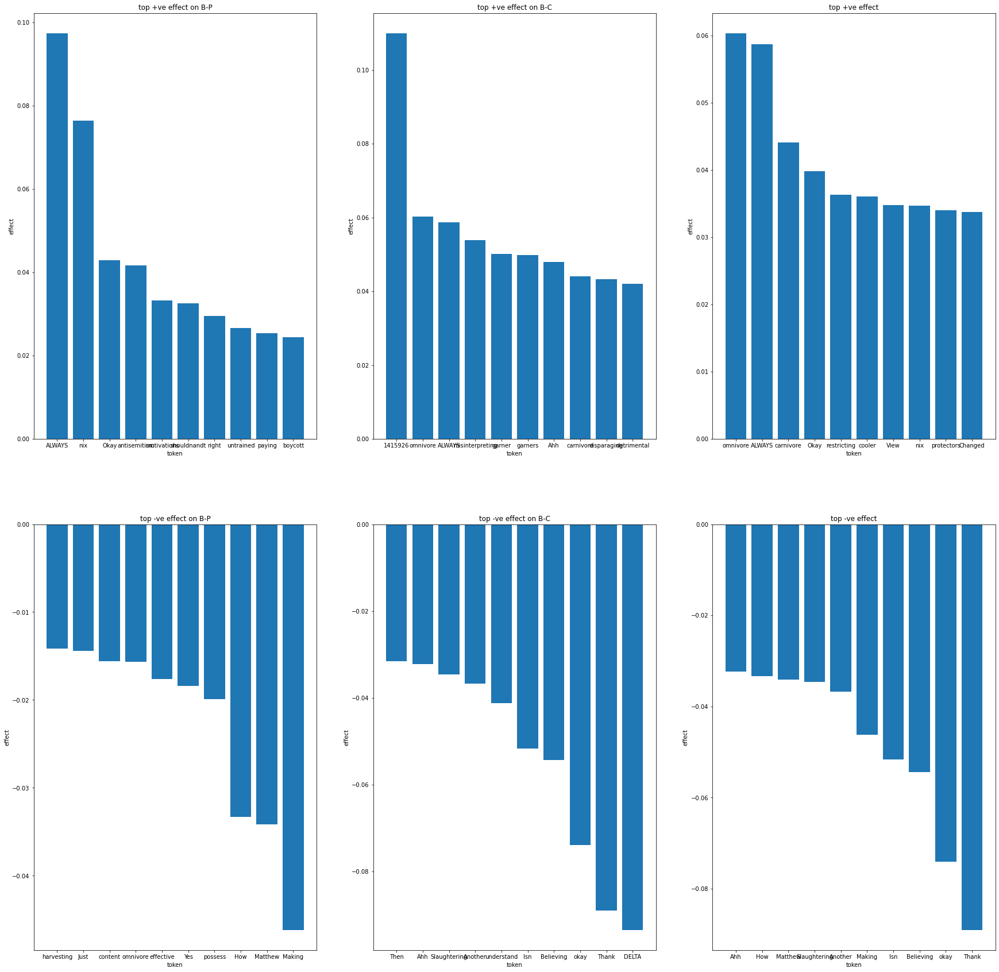

In [ ]:
i = stat_choice[3]
plot2(convert(attention_set['B-P']['Positive'], i), convert(attention_set['B-C']['Positive'], i), convert(attention_set['Net Effect']["Positive"], i), convert(attention_set['B-P']["Negative"], i), convert(attention_set['B-C']["Negative"], i), convert(attention_set['Net Effect']["Negative"], i))

Right Mask

In [ ]:
n_epochs = 1
for epoch in range(n_epochs):
    print(f"------------EPOCH {epoch+1}---------------")
    train_dataset, _, test_dataset = get_datasets()
    # train(train_dataset)
    evaluate_left_right(test_dataset, metric, True)

------------EPOCH 1---------------
ENTER
{'C': {'precision': 0.11013767209011265, 'recall': 0.15572158867479355, 'f1': 0.1290217479840352, 'number': 5086}, 'P': {'precision': 0.08986395861276107, 'recall': 0.18206521739130435, 'f1': 0.12033354714560617, 'number': 7728}, 'overall_precision': 0.09624474789915967, 'overall_recall': 0.17160917746215076, 'overall_f1': 0.1233245471370086, 'overall_accuracy': 0.4956590770551794}


Left Mask

In [ ]:
n_epochs = 1
for epoch in range(n_epochs):
    print(f"------------EPOCH {epoch+1}---------------")
    train_dataset, _, test_dataset = get_datasets()
    # train(train_dataset)
    evaluate_left_right(test_dataset, metric, False)

------------EPOCH 1---------------
ENTER
{'C': {'precision': 0.19389204545454544, 'recall': 0.15133037694013304, 'f1': 0.16998754669987545, 'number': 5412}, 'P': {'precision': 0.1644935850631063, 'recall': 0.20598223615464994, 'f1': 0.18291480600823523, 'number': 7656}, 'overall_precision': 0.17348490333791905, 'overall_recall': 0.18334863789409245, 'overall_f1': 0.17828044198072848, 'overall_accuracy': 0.6059438141343152}


Without Mask

In [ ]:
n_epochs = 1
for epoch in range(n_epochs):
    print(f"------------EPOCH {epoch+1}---------------")
    train_dataset, _, test_dataset = get_datasets()
    # train(train_dataset)
    evaluate(test_dataset, metric)

------------EPOCH 1---------------
ENTER
{'C': {'precision': 0.19153936545240893, 'recall': 0.19267139479905437, 'f1': 0.19210371243370655, 'number': 846}, 'P': {'precision': 0.16885813148788928, 'recall': 0.2582010582010582, 'f1': 0.20418410041841004, 'number': 945}, 'overall_precision': 0.17726480836236932, 'overall_recall': 0.22724734785036294, 'overall_f1': 0.19916809395644725, 'overall_accuracy': 0.5975975272795392}


In [ ]:
sample_text = "I point out that many Christians follow the bible which has numerous examples of sexism, but in application, there are numerous branches of Christianity that are no more sexist than secular groups. For example, Congregationalists and Universaliists."
tokenized_threads = tokenizer.encode(sample_text, return_tensors='pt')
s_inv = tokenizer.decode(tokenized_threads[0])
print(s_inv,"\n", sample_text)

[CLS] I point out that many Christians follow the bible which has numerous examples of sexism, but in application, there are numerous branches of Christianity that are no more sexist than secular groups. For example, Congregationalists and Universaliists. [SEP] 
 I point out that many Christians follow the bible which has numerous examples of sexism, but in application, there are numerous branches of Christianity that are no more sexist than secular groups. For example, Congregationalists and Universaliists.


In [ ]:
!pip3 install lime

     |████████████████████████████████| 275 kB 4.1 MB/s 
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283857 sha256=1812d8116f9f2fed286d773ad6da129400a856494394cd5acbc24d507d453862
  Stored in directory: /root/.cache/pip/wheels/ca/cb/e5/ac701e12d365a08917bf4c6171c0961bc880a8181359c66aa7
Successfully built lime


In [ ]:

from lime import lime_text
from lime.lime_text import LimeTextExplainer

In [ ]:
print(ac_dict)
class_names = ['O', 'B-C', 'I-C', 'B-P', 'I-P']

FrozenDict({
    O: 0,
    B-C: 1,
    I-C: 2,
    B-P: 3,
    I-P: 4,
})


In [ ]:
explainer = LimeTextExplainer(class_names=class_names)

In [ ]:
sample_text = "I point out that many Christians follow the bible which has numerous examples of sexism, but in application, there are numerous branches of Christianity that are no more sexist than secular groups. For example, Congregationalists and Universaliists."
ind = 0
def sigmoid(x):
  return 1 / (1 + np.exp(-x))

def predict_prob(sample_text):
  global ind;
  ret = []
  for i in sample_text:
    s_text = i
    tokenized_threads = tokenizer.encode(s_text, return_tensors='pt')
    # print(tokenized_threads.shape)
    d_tokenized_threads = tokenized_threads.to(device)
    pad_mask = torch.where(tokenized_threads!=tokenizer.pad_token_id, 1, 0).to(device)
    logits = linear_layer(transformer_model(input_ids=d_tokenized_threads,
                                                attention_mask=pad_mask,).last_hidden_state)
    
    x = crf_layer.viterbi_tags(logits, pad_mask)
    logits = logits.clone().cpu().detach().numpy()
    # print(x)
    # print(logits)
    if(logits.shape[1] <= ind):
      a = np.zeros((5,))
      # x = np.array(x[0][0][-1])
      logits[0][-1][0] = sigmoid(logits[0][-1][0])
      logits[0][-1][1] = sigmoid(logits[0][-1][1])
      logits[0][-1][2] = sigmoid(logits[0][-1][2])
      logits[0][-1][3] = sigmoid(logits[0][-1][3])
      logits[0][-1][4] = sigmoid(logits[0][-1][4])
      l = sigmoid(logits[0][-1][0]) + sigmoid(logits[0][-1][1]) + sigmoid(logits[0][-1][2]) + sigmoid(logits[0][-1][3]) + sigmoid(logits[0][-1][4])
      # a[x] = 1
      ret.append(logits[0][-1] / l)
    else:
      a = np.zeros((5,))
      # x = np.array(x[0][0][ind])
      # a[x] = 1
      l = sigmoid(logits[0][ind][0]) + sigmoid(logits[0][ind][1]) + sigmoid(logits[0][ind][2]) + sigmoid(logits[0][ind][3]) + sigmoid(logits[0][ind][4])
      logits[0][ind][0] = sigmoid(logits[0][ind][0])
      logits[0][ind][1] = sigmoid(logits[0][ind][1])
      logits[0][ind][2] = sigmoid(logits[0][ind][2])
      logits[0][ind][3] = sigmoid(logits[0][ind][3])
      logits[0][ind][4] = sigmoid(logits[0][ind][4])
      ret.append(logits[0][ind] / l)
  return np.array(ret)


  

In [ ]:
def predict(sample_text):
  for i in sample_text:
    s_text = i
    tokenized_threads = tokenizer.encode(s_text, return_tensors='pt')
    # print(tokenized_threads.shape)
    d_tokenized_threads = tokenized_threads.to(device)
    pad_mask = torch.where(tokenized_threads!=tokenizer.pad_token_id, 1, 0).to(device)
    logits = linear_layer(transformer_model(input_ids=d_tokenized_threads,
                                                attention_mask=pad_mask,).last_hidden_state)
    
    x = crf_layer.viterbi_tags(logits, pad_mask)
    logits = logits.clone().cpu().detach().numpy()
    print(x)
print(predict_prob([sample_text]))
print(predict([sample_text]))
print(sample_text)

[[0.4033966  0.13058235 0.1252924  0.10358232 0.2371463 ]]
[([0, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 4, 4, 4, 4, 4, 4, 4, 4, 1, 2], -19776.9765625)]
None
I point out that many Christians follow the bible which has numerous examples of sexism, but in application, there are numerous branches of Christianity that are no more sexist than secular groups. For example, Congregationalists and Universaliists.


In [ ]:
sample_text = "I point out that many Christians follow the bible which has numerous examples of sexism, but in application, there are numerous branches of Christianity that are no more sexist than secular groups. For example, Congregationalists and Universaliists."
k = sample_text.split(',')
l = []
for i in k:
  l.extend(i.split('.'))
m = []
for i in l:
  m.extend(i.split(" "))
print(len(m))
e = [0, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 4, 4, 4, 4, 4, 4, 4, 4, 1, 2]

42


In [ ]:

ind = 0
import matplotlib.pyplot as plt


In [ ]:
exp = explainer.explain_instance(sample_text, predict_prob, num_features=10, top_labels = 5)


In [ ]:
%ls
# exp.save_to_file('temp/token_' + str(j) + '.html')
exp.as_list()


arg_mining/             data_dict.pkl          temp/
change-my-view-modes/   Discourse_Markers.txt  tokenizer_pre.pkl
crf_layer.pkl           linear_layer.pt        transformer_layer.pt
cross_entropy_layer.pt  Model/


[('Congregationalists', -0.009154227872310372),
 ('that', 0.005729527993034197),
 ('Universaliists', 0.003516586298636772),
 ('Christianity', -0.0029159567511264765),
 ('secular', 0.0028056549301460594),
 ('point', 0.0027000367285349666),
 ('follow', -0.0025540508256709257),
 ('are', -0.002547116972032874),
 ('there', -0.0023987841751449543),
 ('out', 0.002274157976397849)]

In [ ]:
data_path = "data_dict.pkl"

In [ ]:
data_dict = { "B-P": { "Positive" : {}, "Negative" : {}}, "B-C": { "Positive" : {}, "Negative" : {}}, "Net Effect": { "Positive" : {}, "Negative" : {}}}

In [ ]:
def put(token, data_dict, label):
  key1 = label
  key2 = "Negative"
  if(token[1] > 0):
    key2 = "Positive"
  if(token[0] not in data_dict[key1][key2]):
    data_dict[key1][key2][token[0]] = 0;
  data_dict[key1][key2][token[0]] += token[1]
  key_gen = "Net Effect"
  if(token[0] not in data_dict[key_gen][key2]):
    data_dict[key_gen][key2][token[0]] = 0
  data_dict[key_gen][key2][token[0]] += token[1]
  return data_dict
def lime_set(dataset, explainer, data_dict):
  accumulate_over = 4
  global ind;
  for i, (tokenized_threads, masked_threads, comp_type_labels) in tqdm(enumerate(dataset)):
      # print(comp_type_labels)
      for j, labels in enumerate(comp_type_labels):
        for z in range(len(labels)):
          if(data_config["arg_components"]["B-P"] == labels[z] or data_config["arg_components"]["B-C"] == labels[z]):
            ind = z;
            exp = explainer.explain_instance(tokenizer.decode(tokenized_threads[j]), predict_prob, num_features=10, top_labels = 5)
            lab = "B-P"
            if(labels[z] == data_config["arg_components"]["B-C"]):
              lab = "B-C"
            for token in exp.as_list():
              data_dict = put(token, data_dict, lab)
            with open(data_path, "wb") as f:
              pickle.dump(data_dict, f)
            with open(data_path, "rb") as f:
              data_dict = pickle.load(f)
def count_B(dataset):
  count = 0;
  for i, (tokenized_threads, masked_threads, comp_type_labels) in tqdm(enumerate(get_comment_wise_dataset(dataset))):
      count += 1;
  return count

In [ ]:
from tqdm import tqdm

In [ ]:
train_dataset, _, test_dataset = get_datasets()

In [ ]:
data = []
for i, (tokenized_threads, masked_threads, comp_type_labels) in tqdm(enumerate(get_comment_wise_dataset(train_dataset))):
  data.append( (tokenized_threads, masked_threads, comp_type_labels))

34it [01:26,  2.56s/it]


In [ ]:
runner = "data_runner.pkl"
with open(runner, "wb") as f:
    pickle.dump(data, f)

In [ ]:
print(data)

[([[101, 140, 2107, 2559, 131, 11893, 1110, 1136, 5973, 1137, 1136, 5973, 117, 1157, 8618, 1132, 119, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [29001, 28999, 28999, 1573, 3055, 146, 112, 1396, 1562, 170, 1974, 1104, 8345, 14255, 2007, 1306, 3381, 6489, 1112, 170, 5973, 4483, 1137, 170, 2673, 1776, 4483, 119, 28999, 146, 1553, 1149, 1115, 1242, 7682, 2812, 1103, 16516, 2165, 1134, 1144, 2567, 5136, 1104, 2673, 1863, 117, 1133, 1107, 4048, 117, 1175, 1132, 2567, 5020, 1104, 7522, 1115, 1132, 1185, 1167, 2673, 1776, 1190, 11393, 2114, 119, 28999, 1370, 1859, 117, 26544, 3681, 1105, 6896, 6904, 10047, 119

In [ ]:
print(data_dict)
lime_set(data, explainer, data_dict)

{'B-P': {'Positive': {}, 'Negative': {}}, 'B-C': {'Positive': {}, 'Negative': {}}, 'Net Effect': {'Positive': {}, 'Negative': {}}}


2it [2:55:59, 5279.79s/it]


RuntimeError: ignored

In [ ]:
%matplotlib inline
exp.show_in_notebook(text=False)

In [ ]:
from tqdm import tqdm
for j in tqdm(range(49, -1, -1)):
  # print(j, end = " ")
  ind = j
  exp = explainer.explain_instance(sample_text, predict_prob, num_features=10, top_labels = 5)
  exp.save_to_file('temp/token_' + str(j) + '.html')

100%|██████████| 50/50 [1:28:04<00:00, 105.68s/it]


In [ ]:
%matplotlib inline
exp = explainer.explain_instance(sample_text, predict_prob, num_features=10)
fig = exp.as_pyplot_figure()
%matplotlib inline
exp = explainer.explain_instance(sample_text, predict_prob, num_features=10)
fig = exp.as_pyplot_figure()

KeyboardInterrupt: ignored

torch.Size([1, 50])
(1, 50, 5)


In [ ]:

def plot5(bar_s):
	
	'''
		used to plot 5 images side by side
	'''
	fig, arr = plt.subplots(2, 3)
	fig.set_figheight(20)
	fig.set_figwidth(20)
	img1, img2, img3, img4, img5 = arr[0][0], arr[0][1], arr[0][2], arr[1][0], arr[1][1], arr[1][2]
	img1.set_title("Class 0")
  img2.set_title("Class 1")
  img3.set_title("Class 2")
  img4.set_title("Class 3")
  img5.set_title("Class 4")

	img1.bar([i for i in range(len(bar_s[0]))], bar_s[0])
  img1.bar([i for i in range(len(bar_s[1]))], bar_s[1])
  img1.bar([i for i in range(len(bar_s[2]))], bar_s[2])
  img1.bar([i for i in range(len(bar_s[3]))], bar_s[3])
  img1.bar([i for i in range(len(bar_s[4]))], bar_s[4])

	plt.show()
	plt.close()

In [ ]:
plot5(values_weight)

In [ ]:
plot5(values_bias)

In [ ]:
values_weight

In [ ]:
sample = ['./0.xml']*50


In [ ]:
!pwd

In [ ]:
from arg_mining.datasets.cmv_modes import get_dataset
x = get_dataset(sample, tokenizer, discourse_markers).as_numpy_iterator()


In [ ]:
print(list(x))

In [ ]:
for i, (tokenized_threads, masked_threads, comp_type_labels) in enumerate(get_comment_wise_dataset(x)):
  print(i)

In [ ]:
from bertviz import model_view


In [ ]:
tokenized_threads = tokenizer.encode("I point out that many Christians follow the bible which has numerous examples of sexism, but in application, there are numerous branches of Christianity that are no more sexist than secular groups. For example, Congregationalists and Universaliists.", return_tensors='pt')
d_tokenized_threads = tokenized_threads.to(device)
# print(tokenized_threads)3,60,000/yr
pad_mask = torch.where(tokenized_threads!=tokenizer.pad_token_id, 1, 0).to(device)
# print(pad_mask)
output = transformer_model(input_ids=d_tokenized_threads,
                                        attention_mask=pad_mask,)
print(outpu)

AttributeError: ignored

In [ ]:
tokenized_threads = tokenizer.encode("I point out that many Christians follow the bible which has numerous examples of sexism, but in application, there are numerous branches of Christianity that are no more sexist than secular groups. For example, Congregationalists and Universaliists.", return_tensors='pt')
d_tokenized_threads = tokenized_threads.to(device)
# print(tokenized_threads)3,60,000/yr
pad_mask = torch.where(tokenized_threads!=tokenizer.pad_token_id, 1, 0).to(device)
# print(pad_mask)
output = transformer_model(input_ids=d_tokenized_threads,
                                        attention_mask=pad_mask,)
# output = transformer_model(tokenized_threads)
attention = output[-1]
print(len(attention), attention[0].shape)
tokens = tokenizer.convert_ids_to_tokens(tokenized_threads[0]) 
print(len(tokens), attention[0].shape)
model_view(attention, tokens)

12 torch.Size([1, 12, 50, 50])
50 torch.Size([1, 12, 50, 50])


<IPython.core.display.Javascript object>

In [ ]:
tokenized_threads = tokenizer.encode("For example, Congregationalists and Universaliists. I point out that many Christians follow the bible which has numerous examples of sexism, but in application, there are numerous branches of Christianity that are no more sexist than secular groups. ", return_tensors='pt')
d_tokenized_threads = tokenized_threads.to(device)
# print(tokenized_threads)3,60,000/yr
pad_mask = torch.where(tokenized_threads!=tokenizer.pad_token_id, 1, 0).to(device)
# print(pad_mask)
output = transformer_model(input_ids=d_tokenized_threads,
                                        attention_mask=pad_mask,)
# output = transformer_model(tokenized_threads)
attention = output[-1]
print(len(attention), attention[0].shape)
tokens = tokenizer.convert_ids_to_tokens(tokenized_threads[0]) 
print(len(tokens), attention[0].shape)
model_view(attention, tokens)

In [ ]:
class wrapper():
  model = -1
  tokenizer = -1

  def __init__(model, tokenizer):
    self.model = model
    self.tokenizer = tokenizer

  def predict_proba(text_sample):
    batch = preprocess(text_sample)
    tokenized_threads, token_type_ids = batch
    
    pad_mask = torch.where(tokenized_threads!=tokenizer.pad_token_id, 1, 0)
    
    logits = linear_layer(transformer_model(input_ids=tokenized_threads,
                                            attention_mask=pad_mask,).last_hidden_state)
    
    
    return logits

In [ ]:
import seaborn as sns
%matplotlib inline
from collections import OrderedDict
from lime.lime_text import LimeTextExplainer

explainer = LimeTextExplainer(class_names=class_names)
explanation = explainer.explain_instance(text_sample, pipeline.predict_proba, num_features=10)

weights = OrderedDict(explanation.as_list())
lime_weights = pd.DataFrame({'words': list(weights.keys()), 'weights': list(weights.values())})

sns.barplot(x="words", y="weights", data=lime_weights);
plt.xticks(rotation=45)
plt.title('Sample {} features weights given by LIME'.format(idx));